In [2]:
!unzip -q /content/Dice.zip

replace Dice/test/images/IMG_20191208_112600.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [3]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 12137, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (43/43), done.
remote: Total 12137 (delta 33), reused 28 (delta 14), pack-reused 12080
Receiving objects: 100% (12137/12137), 11.92 MiB | 7.39 MiB/s, done.
Resolving deltas: 100% (8417/8417), done.


In [4]:
%cd yolov5/

/content/yolov5


In [5]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 596 kB 32.7 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [6]:
!python /content/yolov5/train.py --batch 16 --epochs 120 --data coco128.yaml --weights '' --cfg yolov5s.yaml --img 224

train: weights=, cfg=yolov5s.yaml, data=coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=120, batch_size=16, imgsz=224, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 4 (delta 0), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (4/4), done.
From https://github.com/ultralytics/yolov5
   f3174b0..62c6778  update/ci  -> origin/update/ci
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-227-ga6e99e4 Pyth

In [14]:
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [7]:
!python /content/yolov5/val.py --weights /content/yolov5/runs/train/exp/weights/best.pt --data coco128.yaml --img 224 --batch 16

val: data=/content/yolov5/data/coco128.yaml, weights=['/content/yolov5/runs/train/exp/weights/best.pt'], batch_size=16, imgsz=224, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-227-ga6e99e4 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/Dice/valid/labels.cache' images and labels... 25 found, 0 missing, 0 empty, 0 corrupt: 100% 25/25 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 2/2 [00:03<00:00,  1.72s/it]
                 all         25        230      0.157      0.852      0.196      0.102
                   1         25         40      0.153      0.837      0.191     0.0998
       

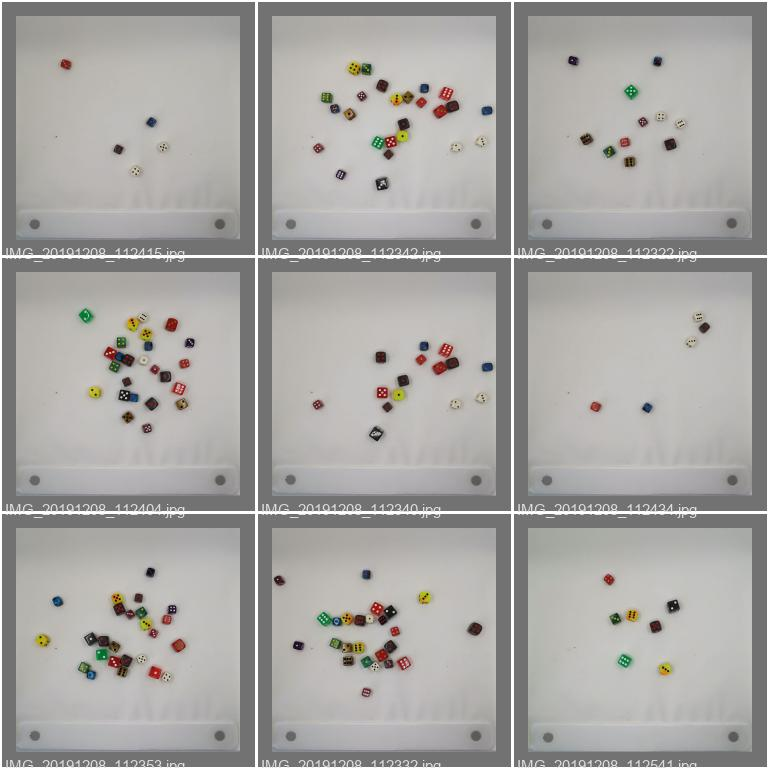

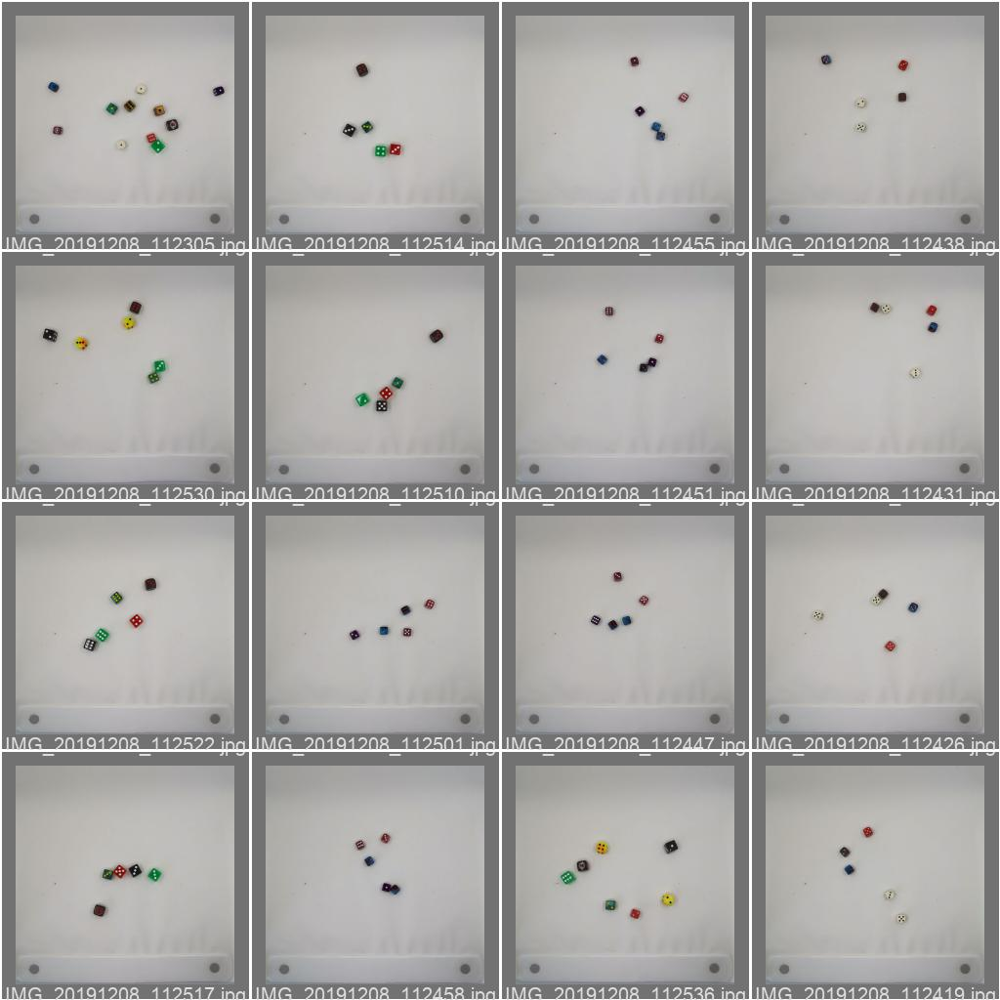

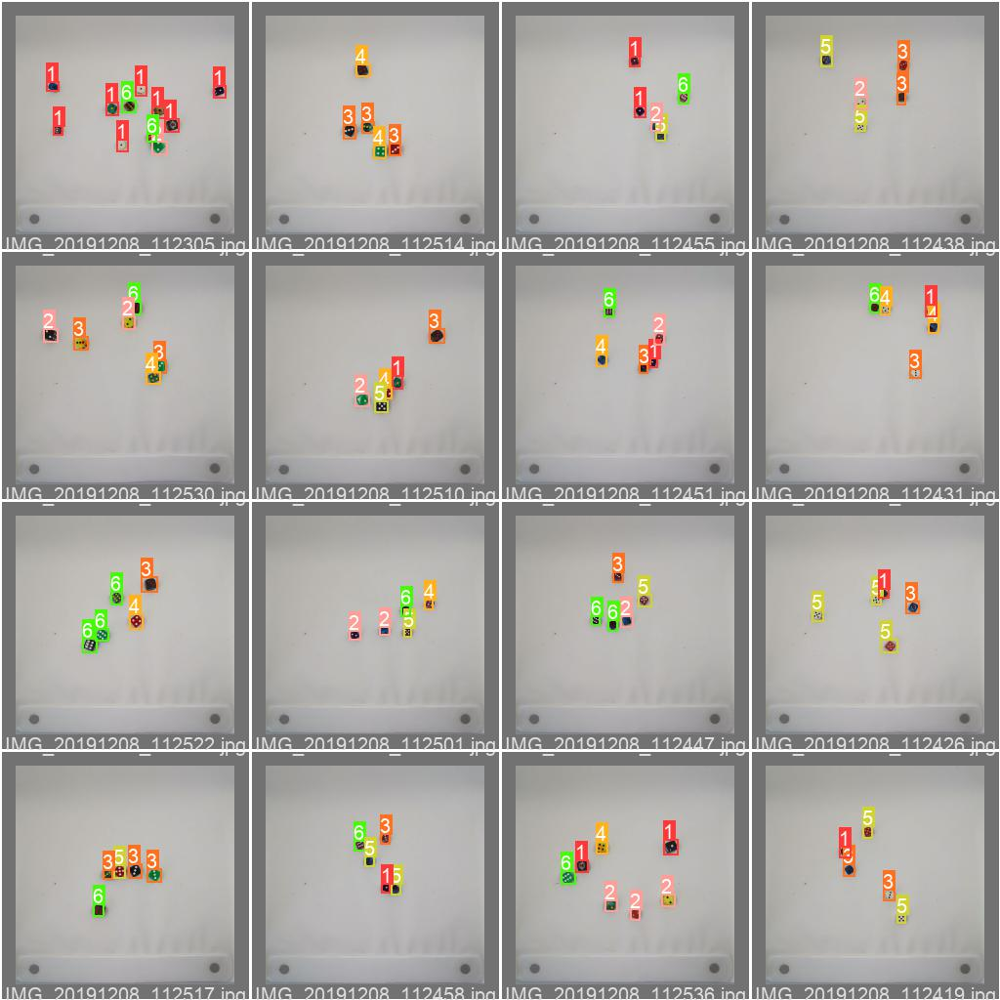

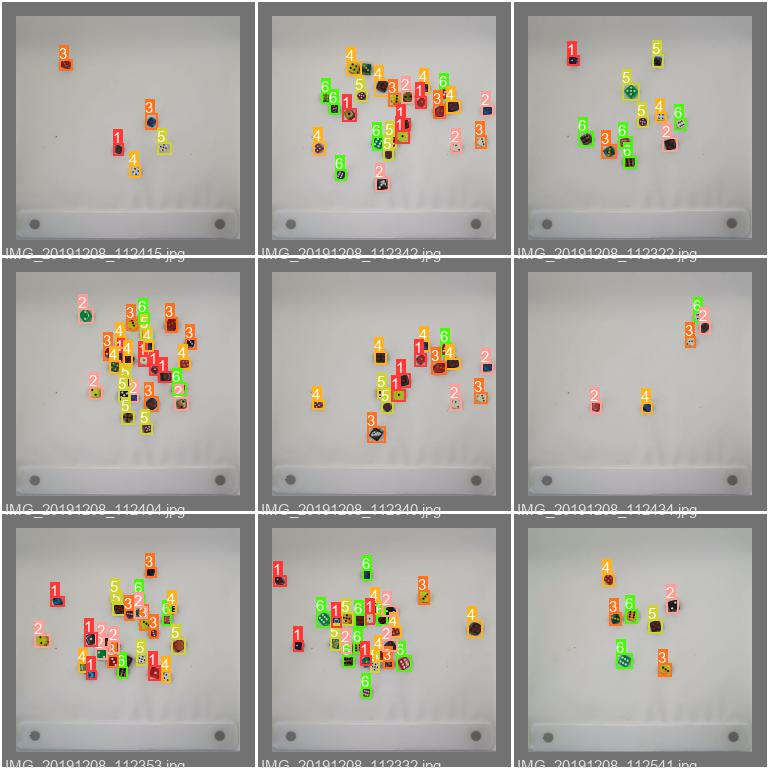

In [8]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/val/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [12]:
!python /content/yolov5/detect.py --source /content/Dice/test/images --weights /content/yolov5/runs/train/exp/weights/best.pt --img 224 --save-txt --save-conf --conf 0.08   

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/Dice/test/images, data=data/coco128.yaml, imgsz=[224, 224], conf_thres=0.08, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-227-ga6e99e4 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/10 /content/Dice/test/images/IMG_20191208_112600.jpg: 224x224 1 1, 1 2, 1 3, 1 5, Done. (0.009s)
image 2/10 /content/Dice/test/images/IMG_20191208_112605.jpg: 224x224 1 1, 1 2, 1 5, 1 6, Done. (0.009s)
image 3/10 /content/Dice/test/images/IMG_20191208_112609.jpg: 224x224 1 1, 1 2, 1 4, 1 5, 1 6, Done. (0.010s)
image 4/10 /conten

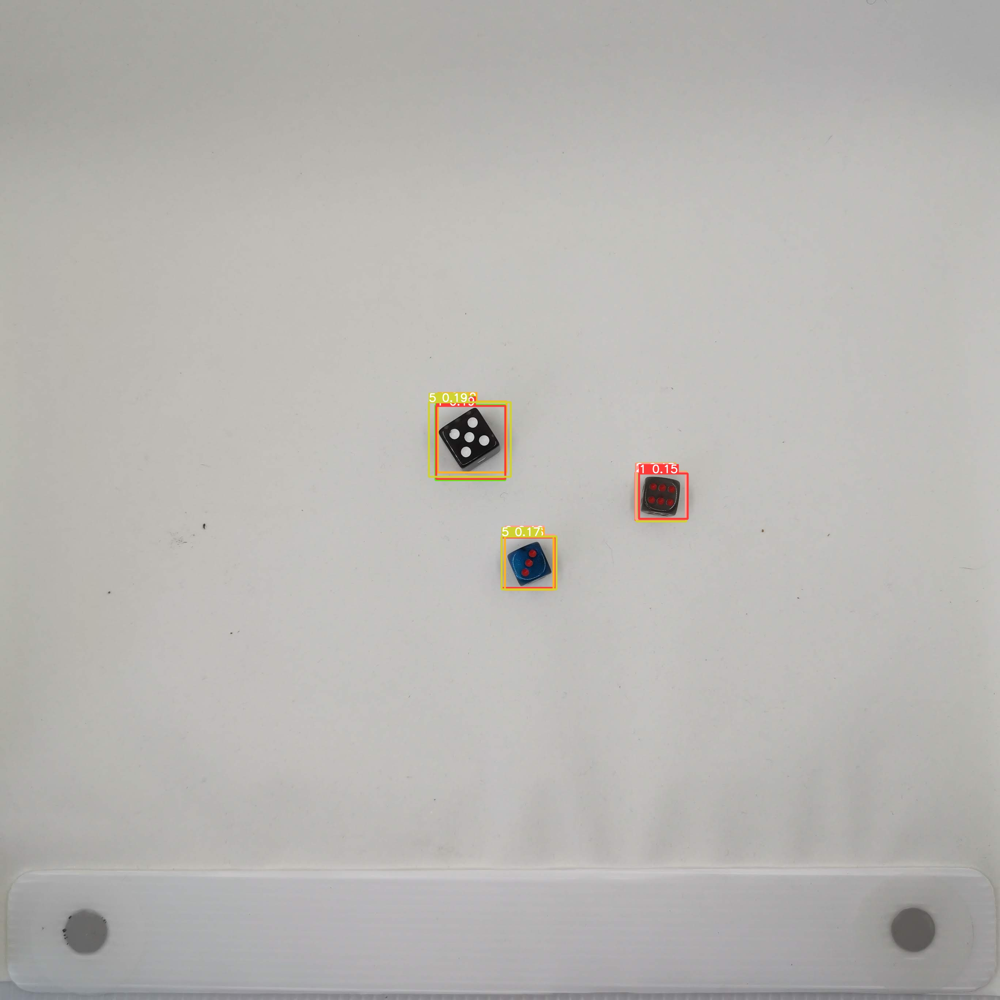

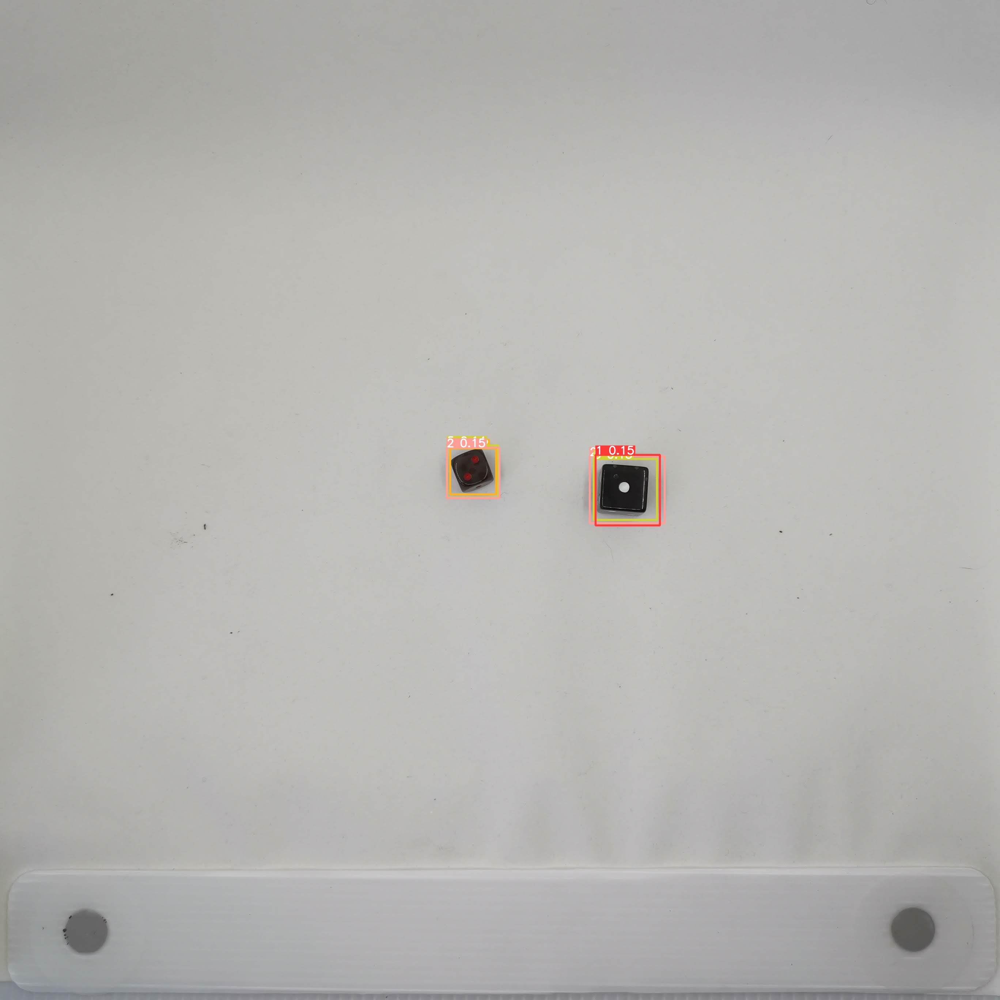

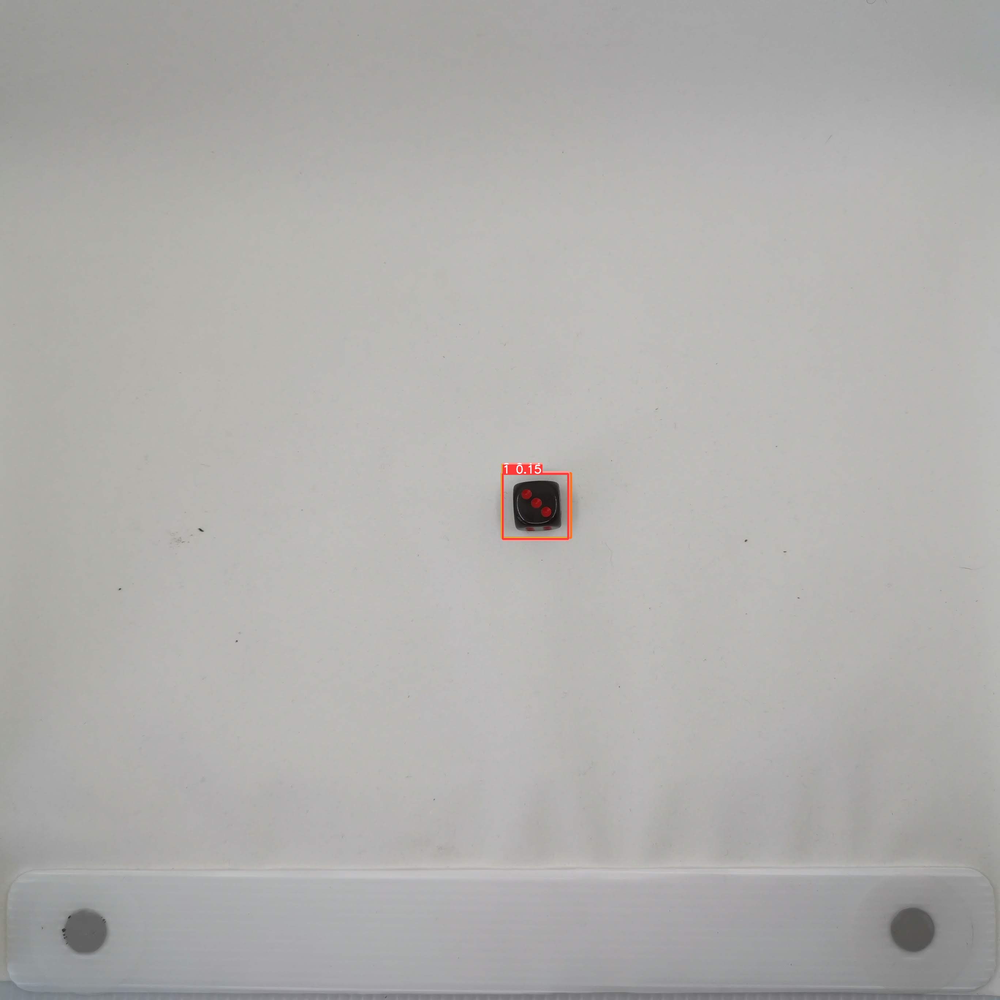

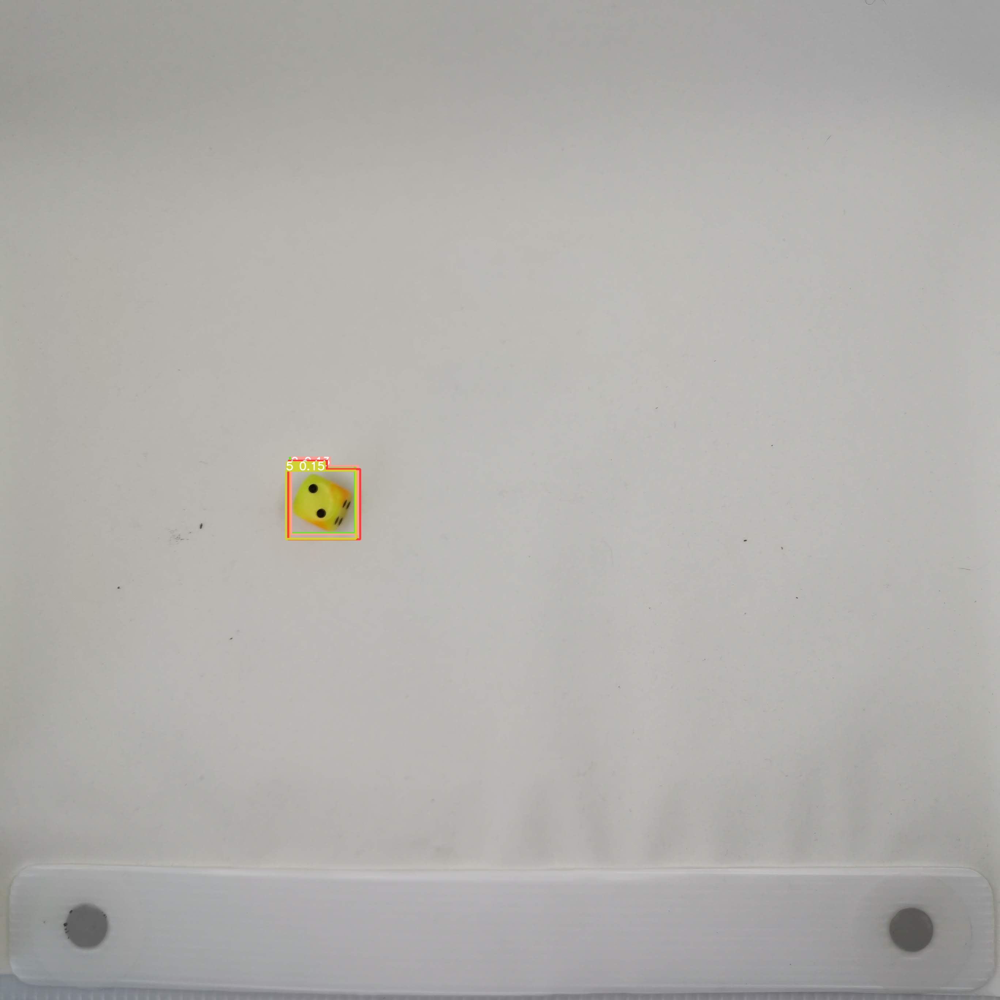

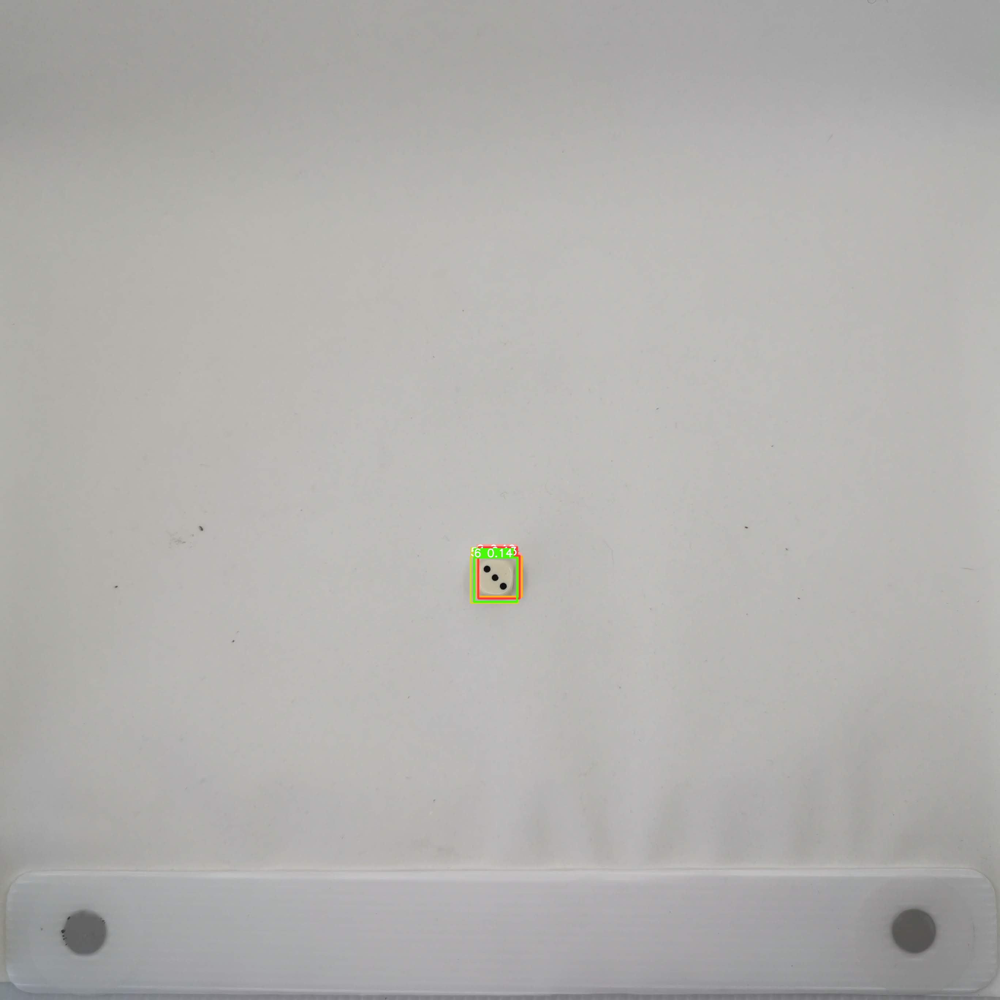

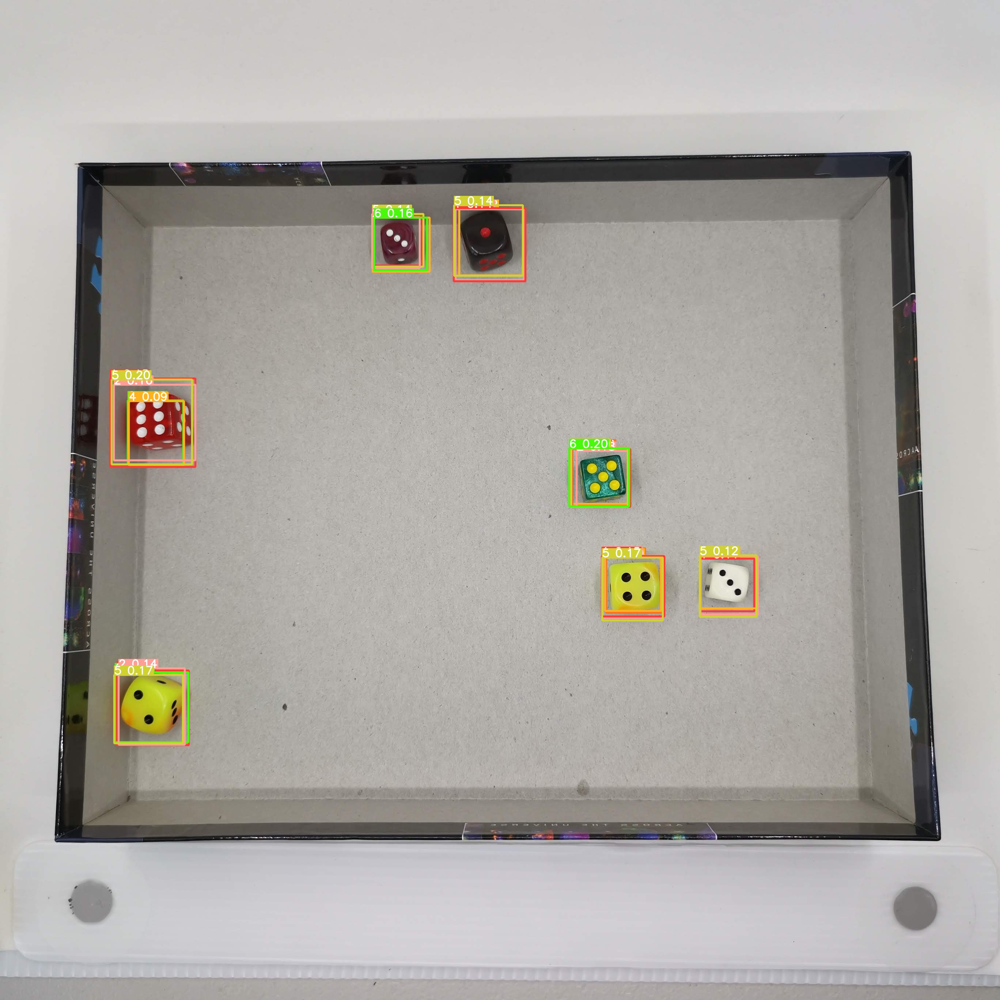

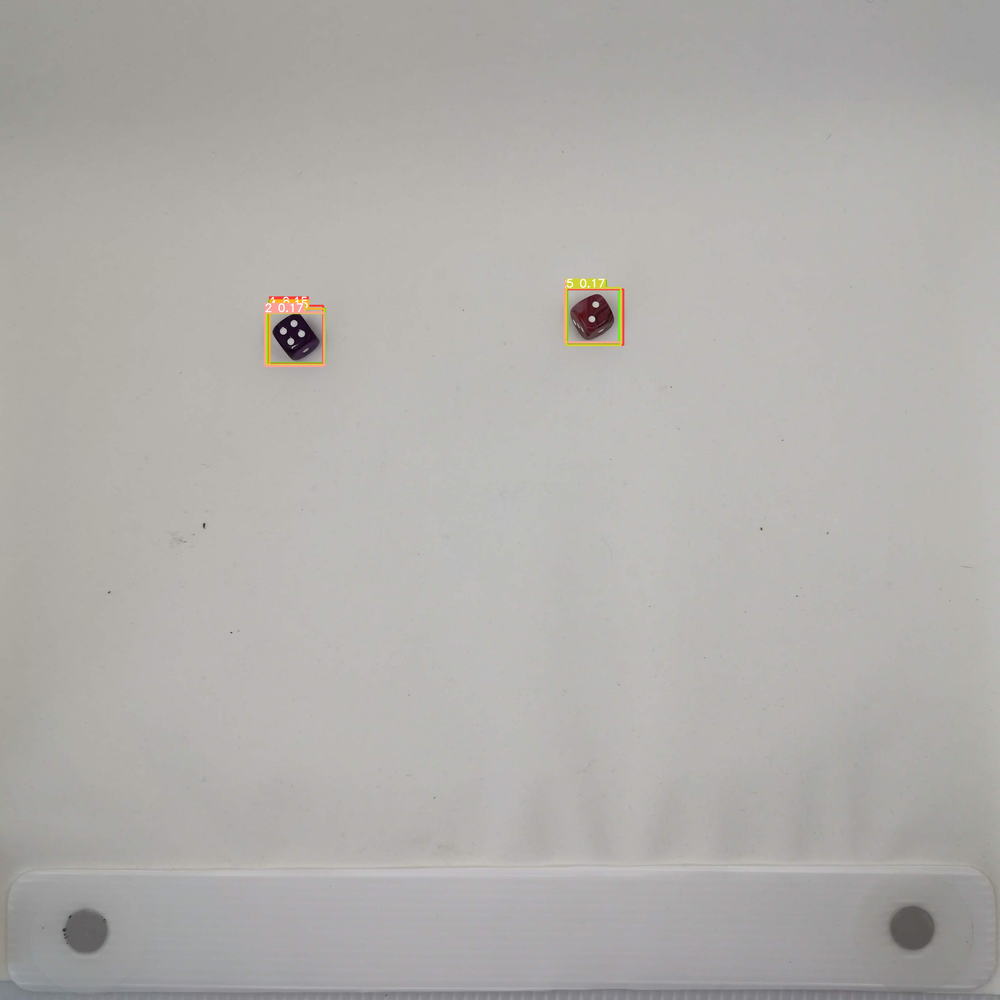

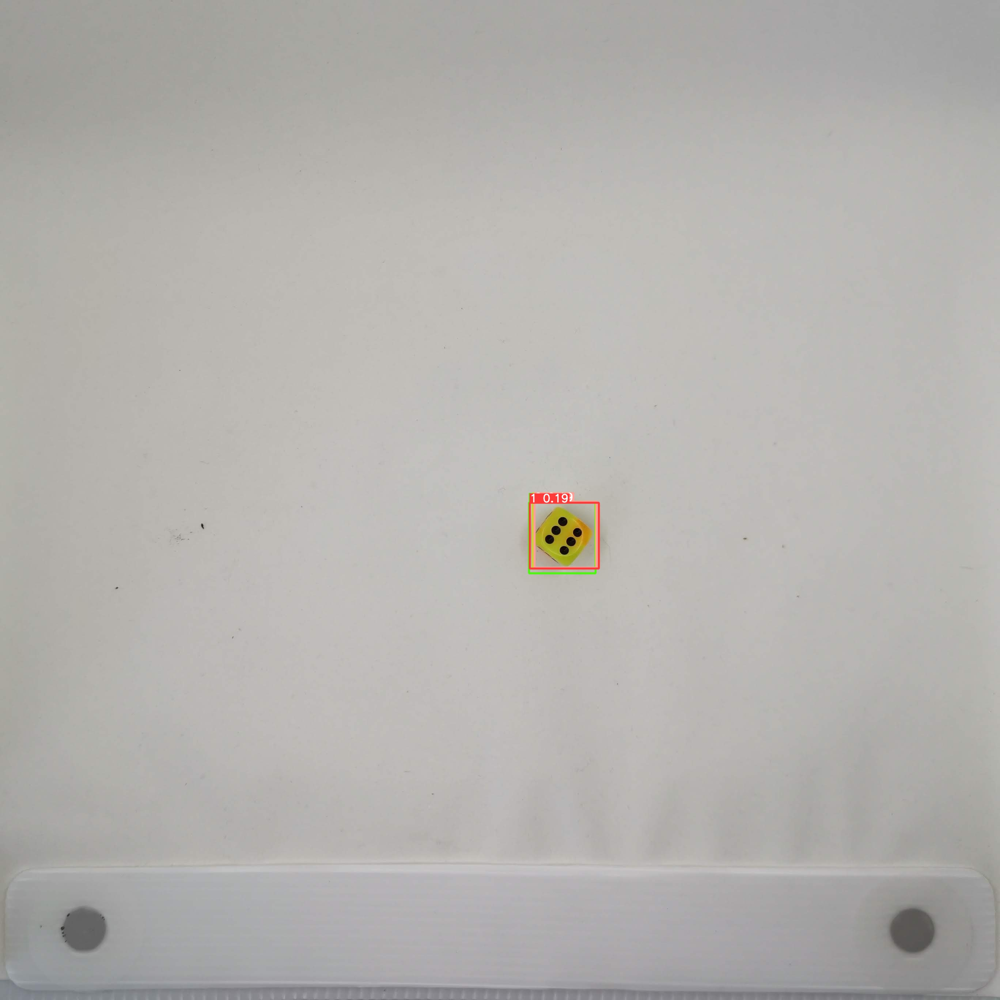

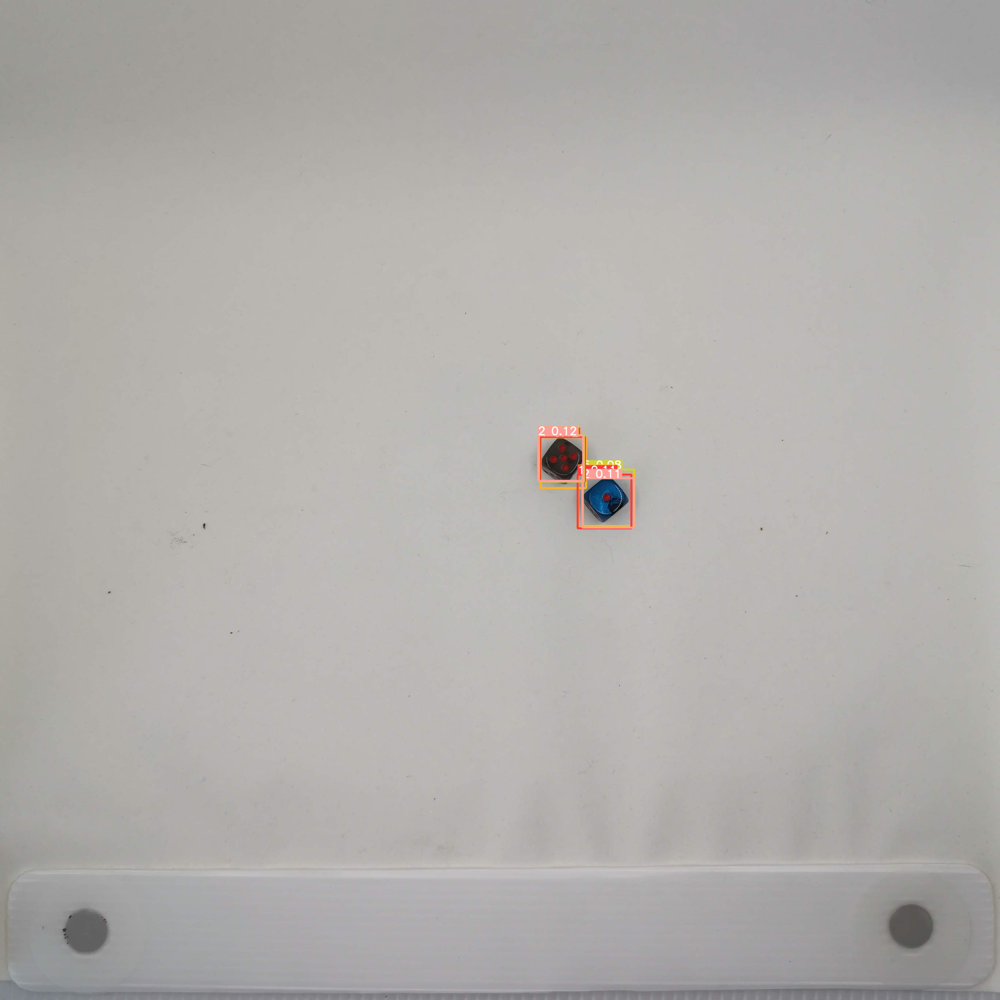

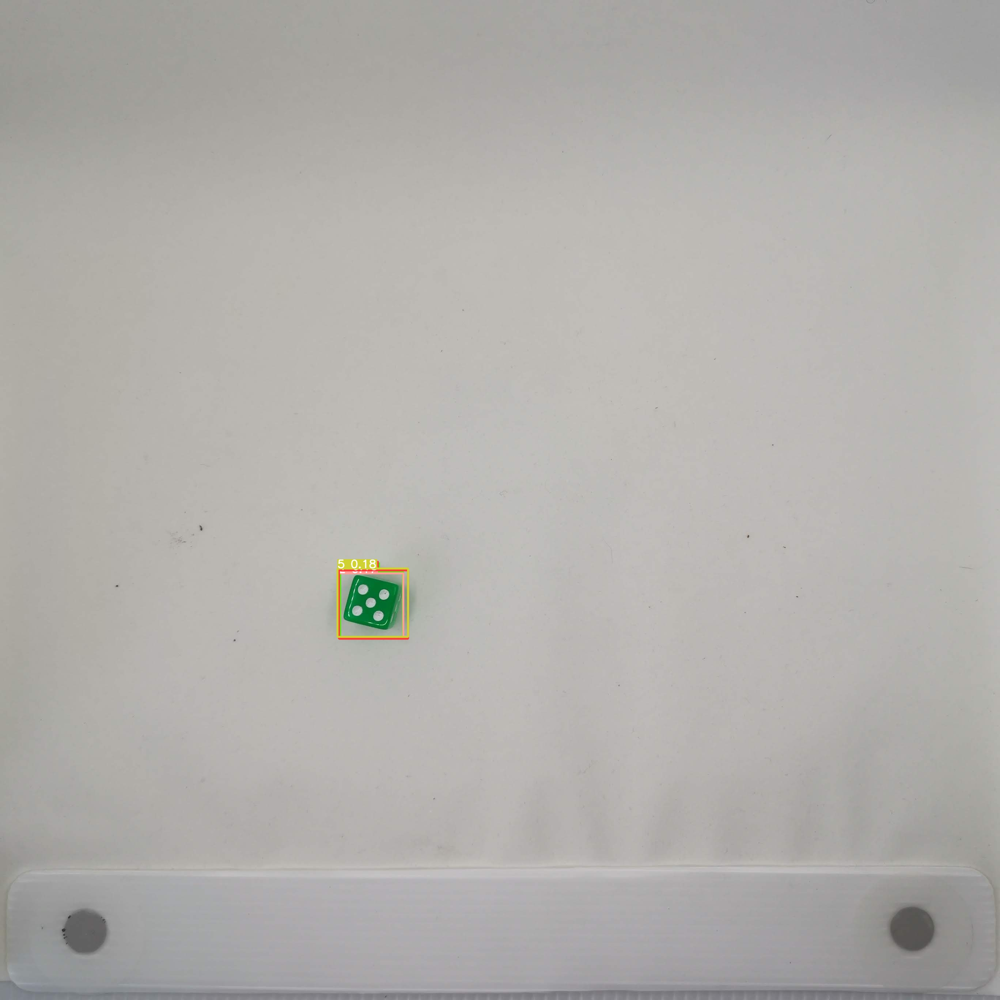

In [13]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")